<a href="https://colab.research.google.com/github/laveena01/apriori/blob/apriori/yolov5.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Detecting aircraft on Airbus Pleiades imagery with YOLOv5

Recently Airbus Intelligence has published a few Machine Learning Datasets on the Kaggle platform.

These datasets are samples from much larger and more comprehensive datasets provided by Airbus.
Nevertheless, they are good datasets to start with and build upon if you wish to learn more about Earth Observation imagery and Deep Learning.

**NOTE: this notebook has been updated on 2023-01-31 to use the latest version of YOLOv5.**

### Libraries imports
First some standard imports.

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import os
import ast
import shutil as sh
from pathlib import Path
import random

import numpy as np
import pandas as pd

import PIL

import torch

from tqdm.auto import tqdm

from IPython.display import Image, clear_output

import matplotlib.pyplot as plt
%matplotlib inline

### Installing YOLOv5 locally
Then we just clone the [YOLOv5](https://github.com/ultralytics/yolov5) repository from Ultralytics. Please visit these links for more information.

In [ ]:
!git clone https://github.com/ultralytics/yolov5  # clone repo
!pip install -qr yolov5/requirements.txt  # install dependencies

Cloning into 'yolov5'...
remote: Enumerating objects: 15637, done.
remote: Counting objects: 100% (244/244), done.
remote: Compressing objects: 100% (143/143), done.
remote: Total 15637 (delta 123), reused 173 (delta 101), pack-reused 15393
Receiving objects: 100% (15637/15637), 14.65 MiB | 23.73 MiB/s, done.
Resolving deltas: 100% (10647/10647), done.
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 184.3/184.3 kB 7.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 kB 6.8 MB/s eta 0:00:00


### Display one random image
The dataset contains 103 images for train and 6 extra images for evaluation (no annotations provided).
Let's display one image randomly.

In [ ]:
! rm -rf '/content/yolo'
! rm -rf '/content/temp'
! rm -rf '/content/temp2'

In [ ]:
!unzip '/content/drive/MyDrive/YOLO/final_dataset2.zip' -d '/content/'

In [ ]:
! mv /content/final_dataset /content/yolo

In [ ]:
!mkdir /content/temp/
# !mkdir /content/temp2/

In [ ]:
DATA_DIR = Path('/content/yolo')
img_list = list(DATA_DIR.glob('images/*.jpg'))
for i in img_list:
  im = PIL.Image.open(i)
  im = im.resize((2560,2560))
  im.save(f'/content/temp/{i.name}')

In [ ]:
DATA_DIR = Path('/content/yolo')
img_list = list(DATA_DIR.glob('extras/*.jpg'))
for i in img_list:
  im = PIL.Image.open(i)
  im = im.resize((2560,2560))
  im.save(f'/content/temp2/{i.name}')

In [ ]:
!rm -rf /content/yolo/images
# !rm -rf /content/yolo/extras

In [ ]:
!mkdir /content/yolo/images/
# !mkdir /content/yolo/extras/

In [ ]:
! cp /content/temp/* /content/yolo/images/
# ! cp /content/temp2/* /content/yolo/extras/

In [ ]:
! rm -rf '/content/temp'
! rm -rf '/content/temp2'

In [ ]:
! cp /content/yolo/images/* /content/yolo/extras/

In [ ]:
! cp /content/drive/MyDrive/YOLO/yolo_test/* /content/yolo/extras/

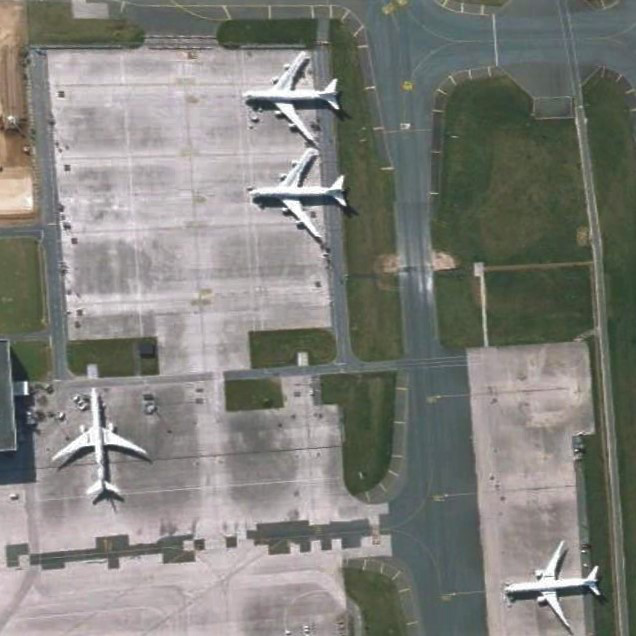

(636, 636)


In [ ]:
DATA_DIR = Path('/content/yolo')
img_list = list(DATA_DIR.glob('extras/*.jpg'))
pickone = random.choice(img_list)
img = PIL.Image.open(pickone)
display(img)
print(img.size)

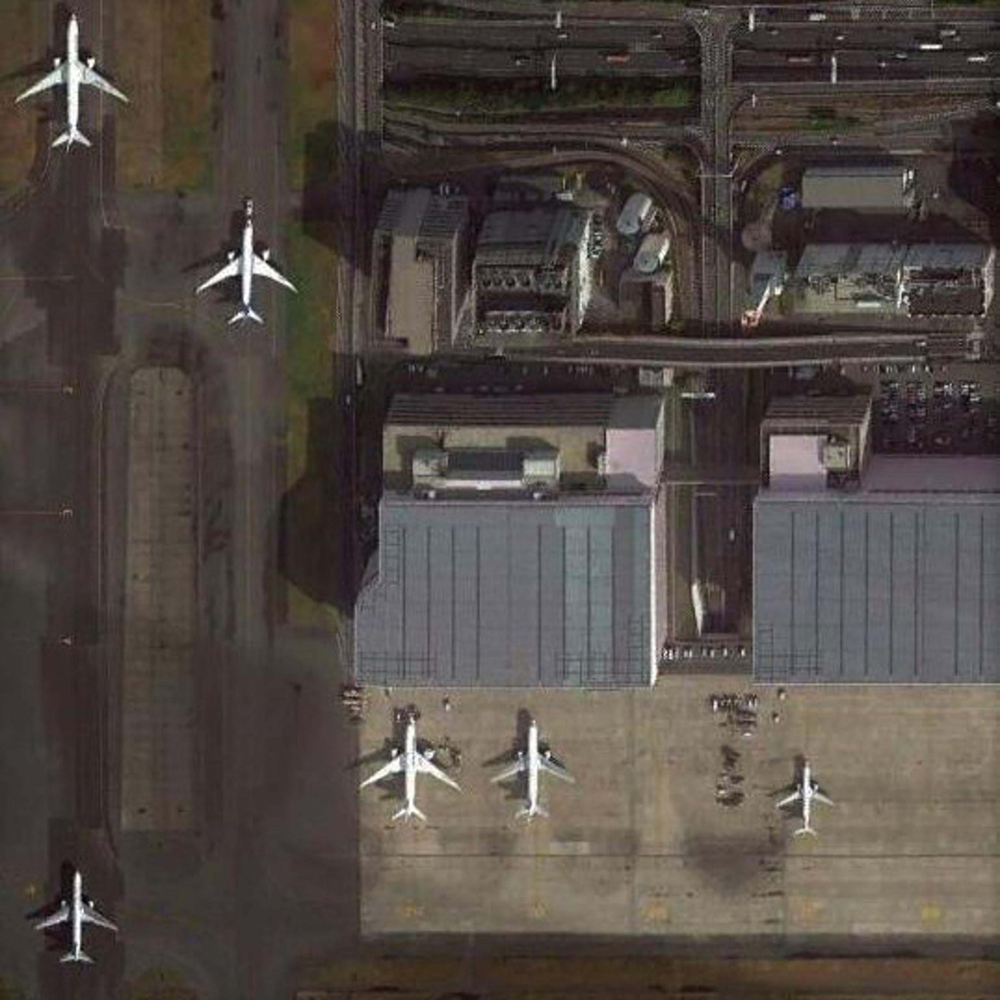

(2560, 2560)


In [ ]:
DATA_DIR = Path('/content/yolo')
img_list = list(DATA_DIR.glob('images/*.jpg'))
pickone = random.choice(img_list)
img = PIL.Image.open(pickone)
display(img)
print(img.size)

In [ ]:
only_files = [DATA_DIR / f.name for f in img_list if os.path.isfile(f) and f.name[-4:] == ".jpg"]
print("Found {} images files in {}".format(len(only_files), DATA_DIR))

IMAGE_HEIGHT, IMAGE_WIDTH = img.size
num_channels = len(img.mode)
print("Image size: {}".format((IMAGE_HEIGHT, IMAGE_WIDTH)))
print("Num channels: {}".format(num_channels))

Found 300 images files in /content/yolo
Image size: (2560, 2560)
Num channels: 3


The images are actually 2560 pixels by 2560 pixels images in RGB (3 bands) in JPEG format. They are extracted from the Pleiades archive and provided at a resolution of 50 cm per pixel. They come from various locations all over the Earth. Some airports are captured more than one to provide diversity in the location of aircraft, the acquisition angles, and the weather conditions.

### Annotations
The annotations are provided as a CSV file with reference the image, geometry as a closed polygon, and class.

In [ ]:
# convert a string record into a valid python object
def f(x):
    return ast.literal_eval(x.rstrip('\r\n'))

df = pd.read_csv(DATA_DIR / "annotations.csv",
                converters={'geometry': f, 'class': lambda o: 'Aircraft'})
df.head(10)

,id,image_id,geometry,class
0,1,1_1.jpg,"[(1163, 1158), (1547, 1158), (1547, 1587), (11...",Aircraft
1,2,1_1.jpg,"[(1612, 1278), (1956, 1278), (1956, 1712), (16...",Aircraft
2,3,1_1.jpg,"[(1996, 1417), (2325, 1417), (2325, 1846), (19...",Aircraft
3,4,1_2.jpg,"[(335, 457), (649, 457), (649, 771), (335, 771...",Aircraft
4,5,1_2.jpg,"[(369, 887), (710, 887), (710, 1215), (369, 12...",Aircraft
5,6,1_2.jpg,"[(1673, 212), (2014, 212), (2014, 532), (1673,...",Aircraft
6,7,1_2.jpg,"[(1673, 560), (2075, 560), (2075, 908), (1673,...",Aircraft
7,8,1_2.jpg,"[(1761, 1304), (2109, 1304), (2109, 1618), (17...",Aircraft
8,9,1_3.jpg,"[(219, 1116), (624, 1116), (624, 1611), (219, ...",Aircraft
9,10,1_3.jpg,"[(1358, 1288), (1925, 1288), (1925, 1887), (13...",Aircraft


There are 3,425 annotations for aircraft including aircraft truncated at the border of the imagery.
Let's parse the geometries to compute some useful metrics.

In [ ]:
def getBounds(geometry):
    try:
        arr = np.array(geometry).T
        xmin = np.min(arr[0])
        ymin = np.min(arr[1])
        xmax = np.max(arr[0])
        ymax = np.max(arr[1])
        return (xmin, ymin, xmax, ymax)
    except:
        return np.nan

def getWidth(bounds):
    try:
        (xmin, ymin, xmax, ymax) = bounds
        return np.abs(xmax - xmin)
    except:
        return np.nan

def getHeight(bounds):
    try:
        (xmin, ymin, xmax, ymax) = bounds
        return np.abs(ymax - ymin)
    except:
        return np.nan

# Create bounds, width and height
df.loc[:,'bounds'] = df.loc[:,'geometry'].apply(getBounds)
df.loc[:,'width'] = df.loc[:,'bounds'].apply(getWidth)
df.loc[:,'height'] = df.loc[:,'bounds'].apply(getHeight)
df.head(10)

,id,image_id,geometry,class,bounds,width,height
0,1,1_1.jpg,"[(1163, 1158), (1547, 1158), (1547, 1587), (11...",Aircraft,"(1163, 1158, 1547, 1587)",384,429
1,2,1_1.jpg,"[(1612, 1278), (1956, 1278), (1956, 1712), (16...",Aircraft,"(1612, 1278, 1956, 1712)",344,434
2,3,1_1.jpg,"[(1996, 1417), (2325, 1417), (2325, 1846), (19...",Aircraft,"(1996, 1417, 2325, 1846)",329,429
3,4,1_2.jpg,"[(335, 457), (649, 457), (649, 771), (335, 771...",Aircraft,"(335, 457, 649, 771)",314,314
4,5,1_2.jpg,"[(369, 887), (710, 887), (710, 1215), (369, 12...",Aircraft,"(369, 887, 710, 1215)",341,328
5,6,1_2.jpg,"[(1673, 212), (2014, 212), (2014, 532), (1673,...",Aircraft,"(1673, 212, 2014, 532)",341,320
6,7,1_2.jpg,"[(1673, 560), (2075, 560), (2075, 908), (1673,...",Aircraft,"(1673, 560, 2075, 908)",402,348
7,8,1_2.jpg,"[(1761, 1304), (2109, 1304), (2109, 1618), (17...",Aircraft,"(1761, 1304, 2109, 1618)",348,314
8,9,1_3.jpg,"[(219, 1116), (624, 1116), (624, 1611), (219, ...",Aircraft,"(219, 1116, 624, 1611)",405,495
9,10,1_3.jpg,"[(1358, 1288), (1925, 1288), (1925, 1887), (13...",Aircraft,"(1358, 1288, 1925, 1887)",567,599


### Validation split
Here, we perform the usual train/valid split in order to control the learning process with a small sample of images which will not be part of the learning batches.
**BEWARE, do not perform the split on the tiles but on the source images. The tiling is done according to the split between training and validation. The tiles from the same image should fall in the same group. Otherwise, you will have data leakage between the train and validation and your validation set will be quite useless.**

In [ ]:
# create a list of images used for validation
fold = 1
num_fold = 5
index = df['image_id'].unique()
val_indexes = index[len(index)*fold//num_fold:len(index)*(fold+1)//num_fold]
print(val_indexes)

['1_61.jpg' '1_62.jpg' '1_63.jpg' '1_64.jpg' '1_65.jpg' '1_66.jpg'
 '1_67.jpg' '1_68.jpg' '1_69.jpg' '1_70.jpg' '1_71.jpg' '1_72.jpg'
 '1_73.jpg' '1_74.jpg' '1_75.jpg' '1_76.jpg' '1_77.jpg' '1_78.jpg'
 '1_79.jpg' '1_80.jpg' '1_81.jpg' '1_82.jpg' '1_83.jpg' '1_84.jpg'
 '1_85.jpg' '1_86.jpg' '1_87.jpg' '1_88.jpg' '1_89.jpg' '1_90.jpg'
 '1_91.jpg' '1_92.jpg' '1_93.jpg' '1_94.jpg' '1_95.jpg' '1_96.jpg'
 '1_97.jpg' '1_98.jpg' '1_99.jpg' '1_100.jpg' '1_101.jpg' '1_102.jpg'
 '1_103.jpg' '1_104.jpg' '1_105.jpg' '1_106.jpg' '1_107.jpg' '1_108.jpg'
 '1_109.jpg' '1_110.jpg' '1_111.jpg' '1_112.jpg' '1_113.jpg' '1_114.jpg'
 '1_115.jpg' '1_116.jpg' '1_117.jpg' '1_118.jpg' '1_119.jpg' '1_120.jpg']


### Tiling
The images are too big for YOLO to learn correctly. We need to make smaller images (or tiles). There are multiple options to do this. Here, we generate the tiles in advance with a selected size of 512 pixels by 512 pixels. In order to make sure that every aircraft can be seen by the network in full, we allow for an overlap of 64 pixels between the tiles. And we generate the tiles in the folder /kaggle/working.

In [ ]:
import os
import tqdm.notebook

# Create 512x512 tiles with 64 pix overlap in /kaggle/working
TILE_WIDTH = 512
TILE_HEIGHT = 512
TILE_OVERLAP = 64
TRUNCATED_PERCENT = 0.3
_overwriteFiles = True

TILES_DIR = {'train': Path('yolov5/train/images/'),
             'val': Path('yolov5/val/images/')}
for _, folder in TILES_DIR.items():
    if not os.path.isdir(folder):
        os.makedirs(folder)

LABELS_DIR = {'train': Path('yolov5/train/labels/'),
              'val': Path('yolov5/val/labels/')}
for _, folder in LABELS_DIR.items():
    if not os.path.isdir(folder):
        os.makedirs(folder)

# Save one line in .txt file for each tag found inside the tile
def tag_is_inside_tile(bounds, x_start, y_start, width, height, truncated_percent):
    x_min, y_min, x_max, y_max = bounds
    x_min, y_min, x_max, y_max = x_min - x_start, y_min - y_start, x_max - x_start, y_max - y_start

    if (x_min > width) or (x_max < 0.0) or (y_min > height) or (y_max < 0.0):
        return None

    x_max_trunc = min(x_max, width)
    x_min_trunc = max(x_min, 0)
    if (x_max_trunc - x_min_trunc) / (x_max - x_min) < truncated_percent:
        return None

    y_max_trunc = min(y_max, width)
    y_min_trunc = max(y_min, 0)
    if (y_max_trunc - y_min_trunc) / (y_max - y_min) < truncated_percent:
        return None

    x_center = (x_min_trunc + x_max_trunc) / 2.0 / width
    y_center = (y_min_trunc + y_max_trunc) / 2.0 / height
    x_extend = (x_max_trunc - x_min_trunc) / width
    y_extend = (y_max_trunc - y_min_trunc) / height

    return (0, x_center, y_center, x_extend, y_extend)

for img_path in tqdm.notebook.tqdm(img_list):
    # Open image and related data
    pil_img = PIL.Image.open(img_path, mode='r')
    np_img = np.array(pil_img, dtype=np.uint8)

    # Get annotations for image
    img_labels = df[df["image_id"] == img_path.name]
    #print(img_labels)

    # Count number of sections to make
    X_TILES = (IMAGE_WIDTH + TILE_WIDTH - TILE_OVERLAP - 1) // (TILE_WIDTH - TILE_OVERLAP)
    Y_TILES = (IMAGE_HEIGHT + TILE_HEIGHT - TILE_OVERLAP - 1) // (TILE_HEIGHT - TILE_OVERLAP)

    # Cut each tile
    for x in range(X_TILES):
        for y in range(Y_TILES):

            x_end = min((x + 1) * TILE_WIDTH - TILE_OVERLAP * (x != 0), IMAGE_WIDTH)
            x_start = x_end - TILE_WIDTH
            y_end = min((y + 1) * TILE_HEIGHT - TILE_OVERLAP * (y != 0), IMAGE_HEIGHT)
            y_start = y_end - TILE_HEIGHT
            #print(x_start, y_start)

            folder = 'val' if img_path.name in val_indexes else 'train'
            save_tile_path = TILES_DIR[folder].joinpath(img_path.stem + "_" + str(x_start) + "_" + str(y_start) + ".jpg")
            save_label_path = LABELS_DIR[folder].joinpath(img_path.stem + "_" + str(x_start) + "_" + str(y_start) + ".txt")

            # Save if file doesn't exit
            if _overwriteFiles or not os.path.isfile(save_tile_path):
                cut_tile = np.zeros(shape=(TILE_WIDTH, TILE_HEIGHT, 3), dtype=np.uint8)
                cut_tile[0:TILE_HEIGHT, 0:TILE_WIDTH, :] = np_img[y_start:y_end, x_start:x_end, :]
                cut_tile_img = PIL.Image.fromarray(cut_tile)
                cut_tile_img.save(save_tile_path)

            found_tags = [
                tag_is_inside_tile(bounds, x_start, y_start, TILE_WIDTH, TILE_HEIGHT, TRUNCATED_PERCENT)
                for i, bounds in enumerate(img_labels['bounds'])]
            found_tags = [el for el in found_tags if el is not None]

            # save labels
            with open(save_label_path, 'w+') as f:
                for tags in found_tags:
                    f.write(' '.join(str(x) for x in tags) + '\n')

  0%|          | 0/300 [00:00<?, ?it/s]

In [ ]:
CONFIG = """
# train and val datasets (image directory or *.txt file with image paths)
train: train/
val: val/

# number of classes
nc: 1

# class names
names: ['Aircraft']
"""

with open("dataset.yaml", "w") as f:
    f.write(CONFIG)

In [ ]:
print('Setup complete. Using torch %s %s' % (torch.__version__, torch.cuda.get_device_properties(0) if torch.cuda.is_available() else 'CPU'))

Setup complete. Using torch 2.0.0+cu118 _CudaDeviceProperties(name='Tesla T4', major=7, minor=5, total_memory=15101MB, multi_processor_count=40)


### Logging
Tensorboard is not available on Kaggle anymore. YOLOv5 provides native integration with **Weights and Biases**
For now, we will only use the standard local logging provided by YOLOv5. for this, we need to remove the wandb package.

In [ ]:
# # Weigths and Biaises (optional)
# import wandb
# wandb.login()
# # 6a47880d97d08b0470d62a33ba7862572155c998

In [ ]:
# Remove Weigths and Biaises if not used.
!pip uninstall wandb

### Training
First, we clean logs from previous runs and launch the training for 10 epochs using pre-trained weights on the COCO dataset.

In [ ]:
# remove previous runs so that following cells works with 'exp' folder
!rm -rf runs

In [ ]:
!python yolov5/train.py --cfg yolov5s.yaml --imgsz 512 --batch-size 16 --epochs 10 --data dataset.yaml --weights yolov5s.pt

train: weights=yolov5s.pt, cfg=yolov5s.yaml, data=dataset.yaml, hyp=yolov5/data/hyps/hyp.scratch-low.yaml, epochs=10, batch_size=16, imgsz=512, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=None, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=yolov5/runs/train, name=exp, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
requirements: /content/requirements.txt not found, check failed.
YOLOv5 🚀 v7.0-147-gaa7c45c Python-3.9.16 torch-2.0.0+cu118 CUDA:0 (Tesla T4, 15102MiB)

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=


So, after a few epochs and no specific tuning, we already get an recall of 86% meaning that 14 aircraft out of one hundred are missed. And we get a precision of 96% which indicates that out of one hundred detected aircraft only 4 are actually not aircraft (i.e. false alarms). Of course, this can be improved but seems pretty good already.


## Logs
During training, we can access the log folder to get insights on how our model is learning.

In [ ]:
# check files provided in log folder
!ls yolov5/runs/train/exp

confusion_matrix.png				    results.png
events.out.tfevents.1682058306.51e178086837.2865.0  train_batch0.jpg
F1_curve.png					    train_batch1.jpg
hyp.yaml					    train_batch2.jpg
labels_correlogram.jpg				    val_batch0_labels.jpg
labels.jpg					    val_batch0_pred.jpg
opt.yaml					    val_batch1_labels.jpg
P_curve.png					    val_batch1_pred.jpg
PR_curve.png					    val_batch2_labels.jpg
R_curve.png					    val_batch2_pred.jpg
results.csv					    weights


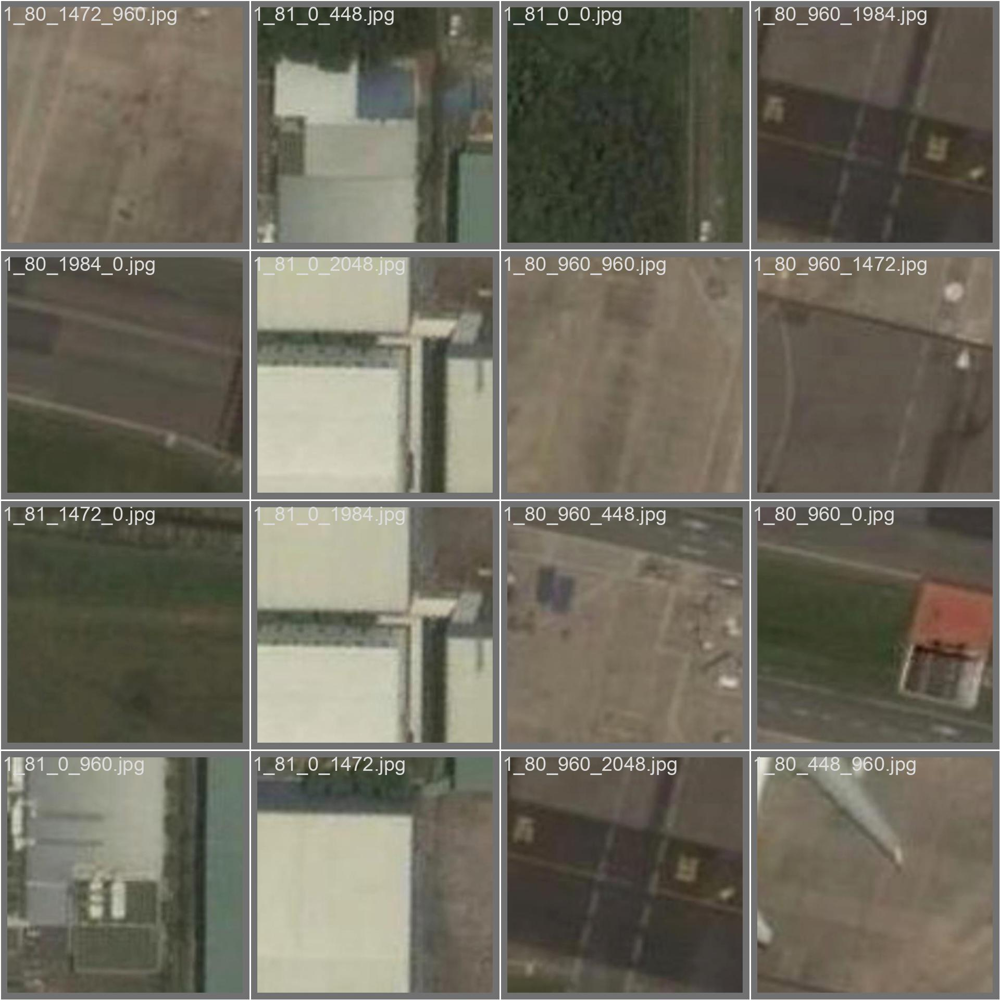

In [ ]:
# predictions on batch 1
Image(filename='yolov5/runs/train/exp/val_batch1_pred.jpg', width=800)

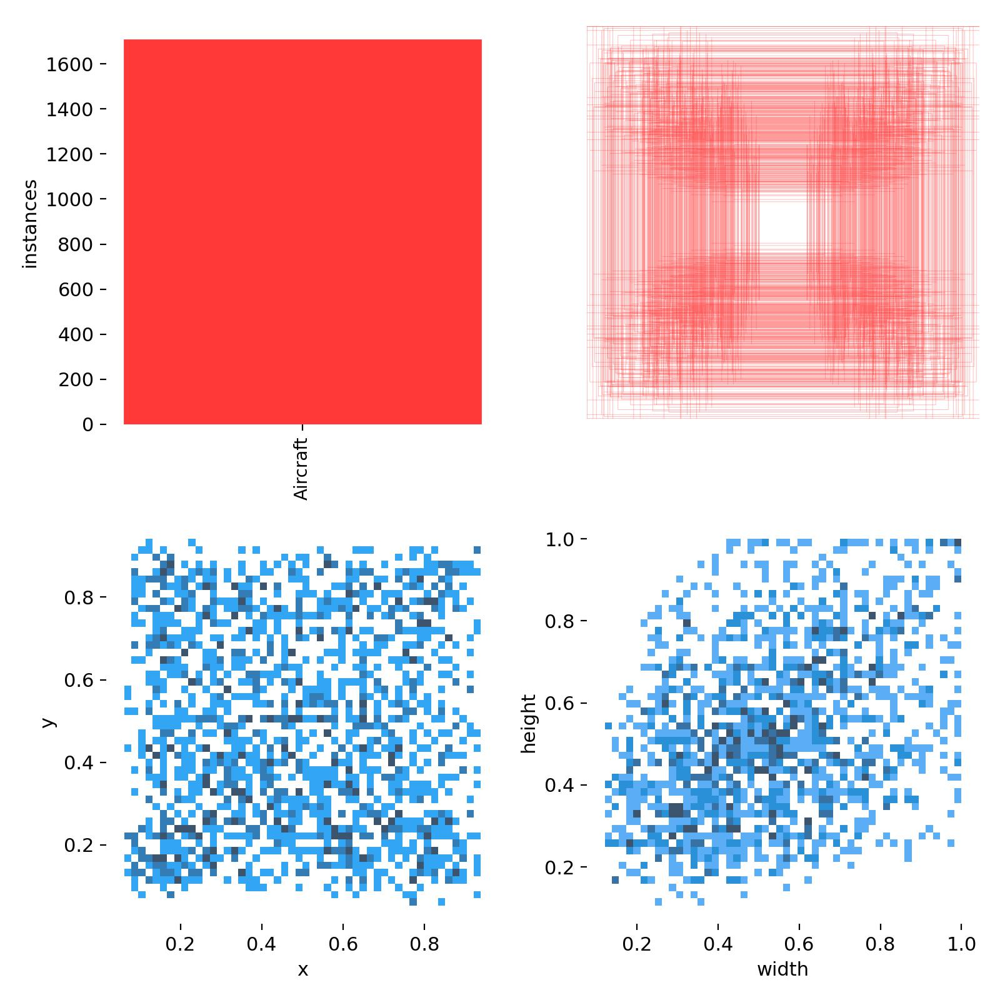

In [ ]:
# analysis of labels and boxes
Image(filename='yolov5/runs/train/exp/labels.jpg', width=800)

In [ ]:
# we can access all parameters values used for this training
!cat yolov5/runs/train/exp/opt.yaml

weights: yolov5s.pt
cfg: /content/yolov5/models/yolov5s.yaml
data: dataset.yaml
hyp:
  lr0: 0.01
  lrf: 0.01
  momentum: 0.937
  weight_decay: 0.0005
  warmup_epochs: 3.0
  warmup_momentum: 0.8
  warmup_bias_lr: 0.1
  box: 0.05
  cls: 0.5
  cls_pw: 1.0
  obj: 1.0
  obj_pw: 1.0
  iou_t: 0.2
  anchor_t: 4.0
  fl_gamma: 0.0
  hsv_h: 0.015
  hsv_s: 0.7
  hsv_v: 0.4
  degrees: 0.0
  translate: 0.1
  scale: 0.5
  shear: 0.0
  perspective: 0.0
  flipud: 0.0
  fliplr: 0.5
  mosaic: 1.0
  mixup: 0.0
  copy_paste: 0.0
epochs: 10
batch_size: 16
imgsz: 512
rect: false
resume: false
nosave: false
noval: false
noautoanchor: false
noplots: false
evolve: null
bucket: ''
cache: null
image_weights: false
device: ''
multi_scale: false
single_cls: false
optimizer: SGD
sync_bn: false
workers: 8
project: yolov5/runs/train
name: exp
exist_ok: false
quad: false
cos_lr: false
label_smoothing: 0.0
patience: 100
freeze:
- 0
save_period: -1
seed: 0
local_rank: -1
entity: null
upload_dataset: false
bbox_interval: 

### Predictions
We can run some predictions on the sample imagery and display one random image.

In [ ]:
!rm -rf yolov5/runs/detect/
!python yolov5/detect.py --source yolo/extras/ --img-size 2560 --weights yolov5/runs/train/exp/weights/best.pt --conf 0.5 --save-txt --save-conf

detect: weights=['yolov5/runs/train/exp/weights/best.pt'], source=yolo/extras/, data=yolov5/data/coco128.yaml, imgsz=[2560, 2560], conf_thres=0.5, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=True, save_conf=True, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=yolov5/runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
requirements: /content/requirements.txt not found, check failed.
YOLOv5 🚀 v7.0-147-gaa7c45c Python-3.9.16 torch-2.0.0+cu118 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
YOLOv5s summary: 157 layers, 7012822 parameters, 0 gradients, 15.8 GFLOPs
image 1/53 /content/yolo/extras/1_11.jpg: 2560x2560 2 Aircrafts, 90.6ms
image 2/53 /content/yolo/extras/1_12.jpg: 2560x2560 9 Aircrafts, 82.7ms
image 3/53 /content/yolo/extras/1_13.jpg: 2560x2560 1 Aircraft, 80.8ms
image 4/53 /content/yolo/extras/1_14.jpg: 2560x2560 

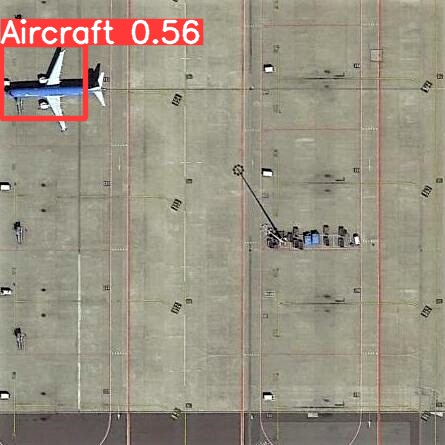

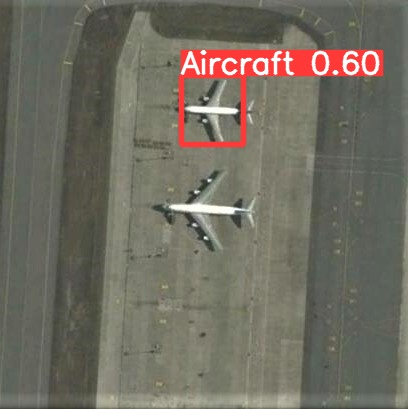

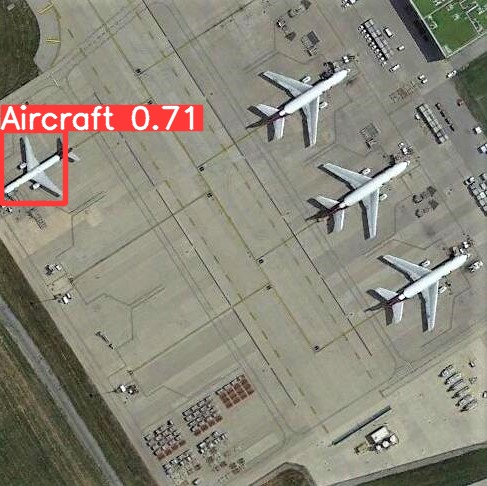

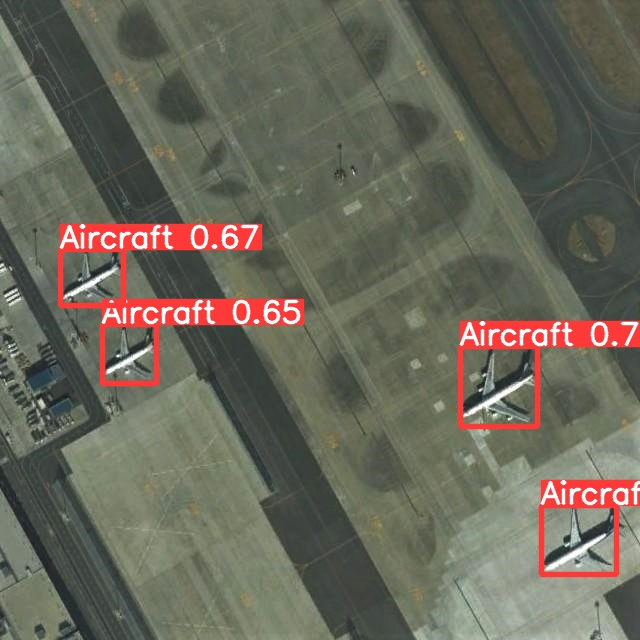

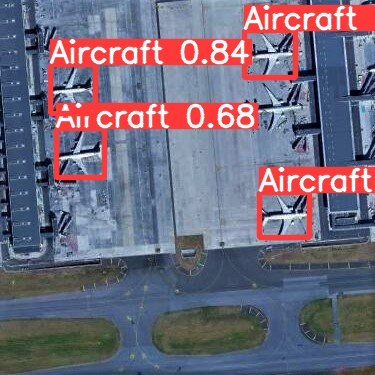

...

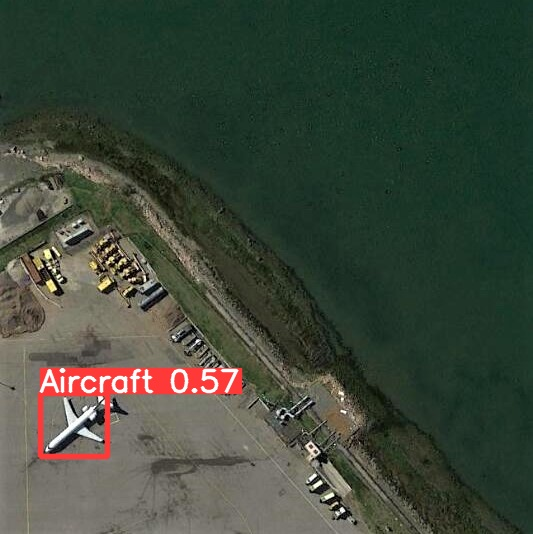

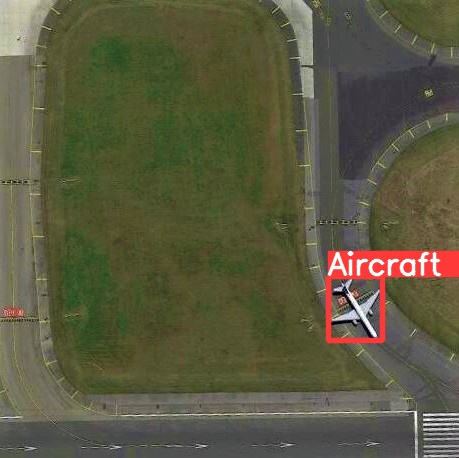

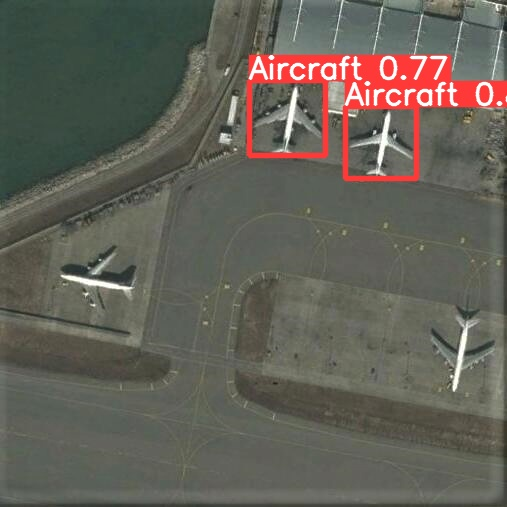

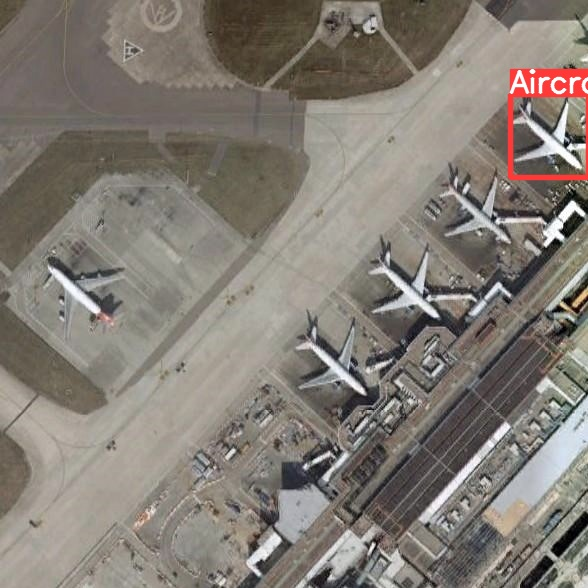

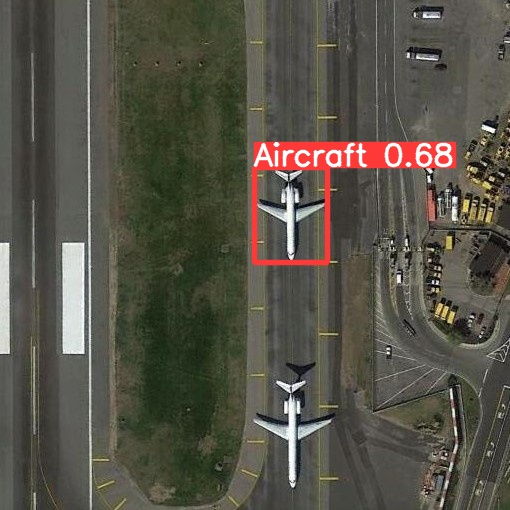

In [ ]:
import glob
from IPython.display import Image, display

for image_path in glob.glob('yolov5/runs/detect/exp/*.jpg'):
      display(Image(filename=image_path, width=1024))
      print("\n")

In [ ]:
! mv '/content/yolov5/runs/detect/exp/labels' '/content/drive/MyDrive/wsadd_labels'

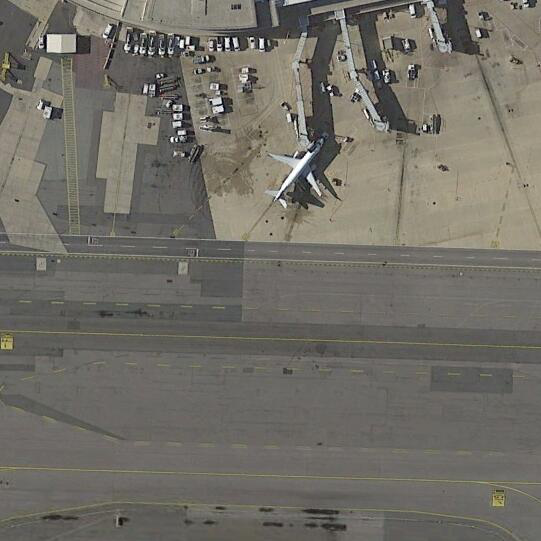

(541, 541)


In [ ]:
img = "/content/drive/MyDrive/data/YOLO/yolo_test/1_10.jpg"
img = PIL.Image.open(img)
display(img)
print(img.size)

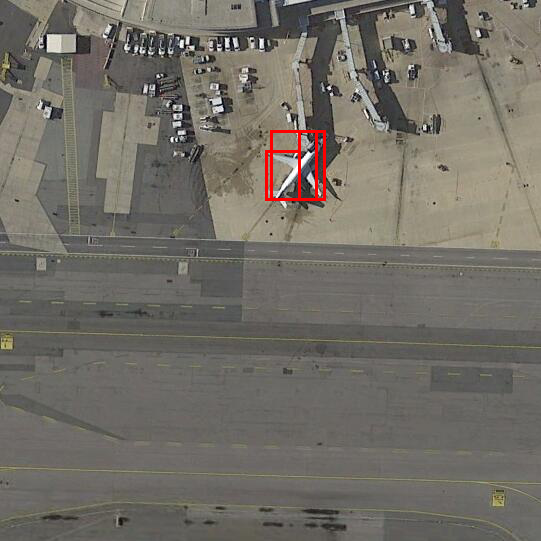

In [ ]:
from PIL import ImageDraw

draw = ImageDraw.Draw(img)
draw.rectangle(((265, 150), (300, 200)), outline = "red", width = 3)
draw.rectangle(((270, 130), (300, 200)), outline = "red", width = 3)
draw.rectangle(((270, 130), (325, 200)), outline = "red", width = 3)
draw.rectangle(((315, 130), (325, 200)), outline = "red", width = 3)

# draw.rectangle(((270, 130), (325, 200)), outline = "red", width = 3)

display(img)